# Image Classification by Transfer Learning and Comparison of Custom CNN Model to Pre-trained Models.

In [ ]:
### Project by: Janvi Patel and Prerak Trivedi

### This code requires python 3.8.6 64-bit version to install tensorflow and keras.

### Checking for the libraries and installing them.


In [3]:
import sys
!{sys.executable} -m pip install tensorflow random2 numpy pandas matplotlib seaborn scikit-learn keras opencv-python tqdm Pillow dash flask plotly

You should consider upgrading via the 'C:\Users\Janvi\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip' command.
  Created wheel for random2: filename=random2-1.0.1-py3-none-any.whl size=12075 sha256=19734e248c798e826c441d7f96bcdb08709158ca55d4adffd4d412114c2bf6fb
  Stored in directory: c:\users\janvi\appdata\local\pip\cache\wheels\6e\ca\f2\082dec051ffcaec249ae491b8c90e305726a7390274682b4a4
Successfully built random2


### Loading libraries for models and visualization

In [32]:
#    ML CLASSIFICATION MODEL  ***********************-------------------------------------------------------
import tensorflow as tf
import random as rn

# Data Visualisation 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns

#model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,roc_curve,roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
 
#configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
#% matplotlib inline  
style.use('fivethirtyeight')
sns.set(style='whitegrid',color_codes=True)

#Preprocess
from keras.preprocessing.image import ImageDataGenerator

#dl libraraies
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam,SGD,Adagrad,Adadelta,RMSprop
from keras.utils import to_categorical

# specifically for cnn
from keras.layers import Dropout, Flatten,Activation
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
plt.style.use('seaborn-dark-palette') 
 
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# specifically for manipulating zipped images and getting numpy arrays of pixel values of images.
import cv2                  
import numpy as np  
from tqdm import tqdm
import os                   
from random import shuffle  
from PIL import Image

### Loading data (Note : Please provide the path of your data in which data is stored)

In [33]:
# Loading data. Please keep the format as shown below ending with \\.
path_flower = "New_Flowers\\"
path_fashion = "Fashion\\"

### Preparing data
#### There are total 4138 flower images we have used for image classification in which there are 5 subfolders of different flowers categories such as daisy, sunflower, tulip, dandelion, and rose. Now, in first step we have made directory for each folder of image and all of them are given labels with respect to their appropriate classes. For instance, all daisy images belongs to flower_daisy_dir, sunflower belongs to flower_sunflower_dir, etc and then we are saving all the directories in 'DIR' variable to use them in following code. Then we have labeled the flowers and resized the images because all the images might have different sizes so we have made all images to 150x150 size.  

In [35]:
A=[]
B=[]
IMG_SIZE=150
FLOWER_DAISY_DIR= path_flower + 'daisy'
FLOWER_SUNFLOWER_DIR= path_flower + 'sunflower'
FLOWER_TULIP_DIR= path_flower + 'tulip'
FLOWER_DANDI_DIR= path_flower + 'dandelion'
FLOWER_ROSE_DIR= path_flower + 'rose'

DIR = path_flower

#### Instead of coding separately for each task, we designed two functions that would do all the task of reading the images, resizing it and labeling the array of images to their labels. Since our data has different folders containing individual categories of images, it became very easy for us to label the images during initial stages. Moreover, in below code we have printed the length of each subfolder of images. The length is being added after each count of subfolder for example, daisy images(749) + sunflower(698) = 1447 and rest for other images as well.So, in the end we can see that at the rose count it shows the total images of sub folders which is 4138 images.

In [36]:
# Label function to label the flowers
def assign_label(image,flower_type):
    return flower_type

#train data split
def make_train_data(flower_type,DIR):
    for image in tqdm(os.listdir(DIR)): #progress bar for better view
        label=assign_label(image,flower_type)
        path_flower = os.path.join(DIR,image)
        image = cv2.imread(path_flower,cv2.IMREAD_COLOR)
        image = cv2.resize(image, (IMG_SIZE,IMG_SIZE))
        
        A.append(np.array(image))
        B.append(str(label))

make_train_data('Daisy',FLOWER_DAISY_DIR)
print('Daisy Count: ',len(A))

make_train_data('Sunflower',FLOWER_SUNFLOWER_DIR)
print('Sunflower Count: ',len(A))

make_train_data('Tulip',FLOWER_TULIP_DIR)
print('Tulip Count: ',len(A))

make_train_data('Dandelion',FLOWER_DANDI_DIR)
print('Dandelion Count: ',len(A))

make_train_data('Rose',FLOWER_ROSE_DIR)
print('Rose Count: ',len(A))

100%|██████████| 728/728 [00:12<00:00, 60.00it/s]Rose Count:  4138



### Visualizing different flower images

#### We performed some basic image resizing by changing the image to 150 x 150 size to remove the unwanted background. It is also a strict requirement for the application of CNN that all images are of the same size.

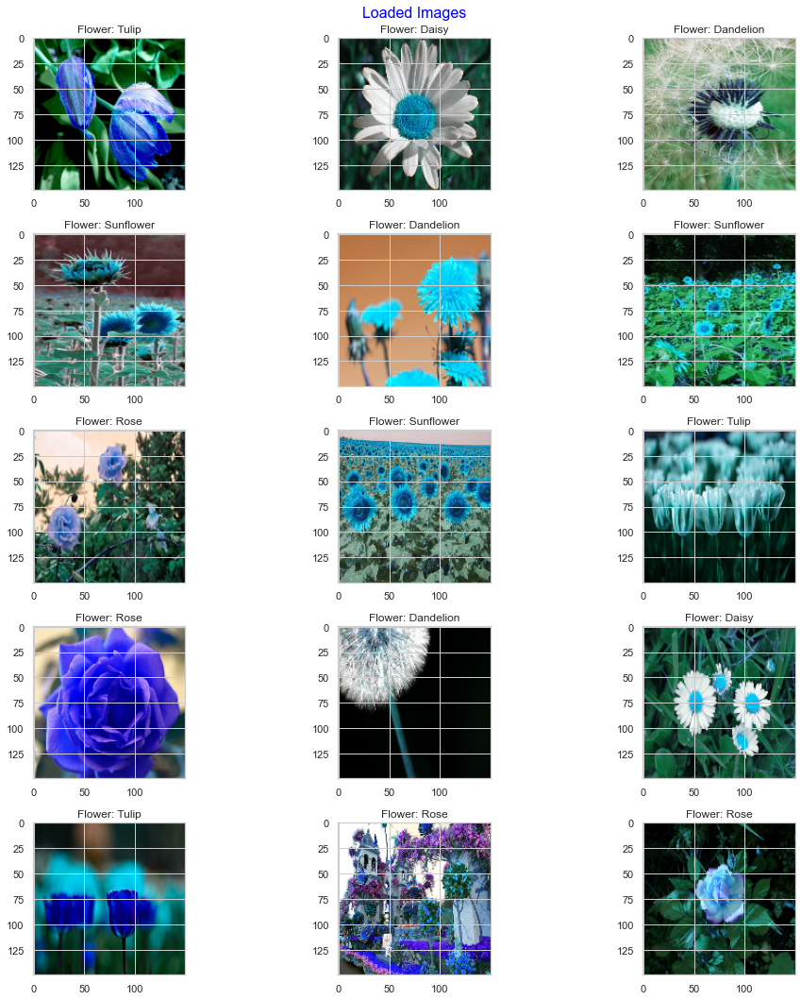

In [37]:
#Visualize Images
import random as rn
fig,ax=plt.subplots(5,3)
fig.set_size_inches(15,15)
for i in range(5):
    for j in range (3):
        l=rn.randint(0,len(B))
        ax[i,j].imshow(A[l])
        ax[i,j].set_title('Flower: '+B[l])
fig.suptitle('Loaded Images', color='Blue', fontsize=16)        
plt.tight_layout()

#### The next step of machine learning is encoding the labels in form of vectors. Since we have 5 categories of flowers, the whole array of flowers was divided into 5 different categories and divided by 255 (to range the value of pixels between 0 and 1) as the maximum pixel value of an 8-bit image is 255 (the brightest pixel).

In [38]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
le=LabelEncoder()
q=le.fit_transform(B)
q=to_categorical(q,5)
A=np.array(A)
A=A/255
print('The data has been categorized')

The data has been categorized


In [39]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(A,q,test_size=0.25,random_state=42)
print('The data has been successfully split into test and train with 25% test data')


The data has been successfully split into test and train with 25% test data


#### The dataset was split into training and testing dataset. The training dataset contains 3103 images and testing contain 1035 images which is 75 percent and 25 percent of the dataset for respective purposes. The same number of images have also been used for the model validation and prediction.

In [40]:
# shape of the training and test set
#(x_train.shape, x_test.shape), (y_train.shape, y_test.shape)
# Understanding number of images, their shapes and size.
print('All images are of {}x{} size and have {} color channels'.format(x_train.shape[1],x_train.shape[2],x_train.shape[3]))
print('Number of images used for training the model as independent are: ',x_train.shape[0])
print('Number of images used for testing the model independent are: ',x_test.shape[0])
print('Number of images used for prediction in the model dependent are: ',y_train.shape[0])
print('Number of images used for testing accuracy between actual and predicted categories are: ',y_test.shape[0])

All images are of 150x150 size and have 3 color channels
Number of images used for training the model as independent are:  3103
Number of images used for testing the model independent are:  1035
Number of images used for prediction in the model dependent are:  3103
Number of images used for testing accuracy between actual and predicted categories are:  1035


### Implementation of Sequential Model
#### Convolutional Neural Network (CNN) is one of the best machine learning models which are used for any techniques that can be applied for the models dealing in images. CNN takes inout as an image and extracts important feature from images and then this image is given as an input to max pooling layer which is our second step of our CNN model. In this next layer a filter of some size, for example, 5 x 5 x 3 which rotates over the whole image of 150 x 150 x 3 to extract various important features which is a result of dot product of filter and image and also it will pick maximum value based on the filter and then this value will be stored in feature map matrix. So, here we have used 4 layers of convolutional layer and 4 max pooling layer. After that we added on e droup out layer which will remove unwanted noise of images.The ninth layer is a flattening layer which converts the two-dimensional data into vector that can be fed into the fully connected networks. The activation layers we have used are relu and softmax layer in which reLu activation layer (f(x) = max(x,0)) assures that the output does not have any negative values as they can act as noise. However, the softmax function then assures that the output stays within the range of 0 and 1 using probability distribution. The dense layer is a fullt connected layer in which all neurons are connected to those on next layer. 

In [41]:
# defining the model architecture
model = Sequential()
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same',activation ='relu', input_shape = (150,150,3)))
model.add(MaxPooling2D(pool_size=(2,2)))
# model.add(Dropout(0.25))

model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
#model.add(Dropout(0.25))

model.add(Conv2D(filters =96, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
# model.add(Dropout(0.25))

model.add(Conv2D(filters = 96, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(5, activation = "softmax"))


#### Now it comes to defining of batch size and epochs. So basically batch size will decide the number of training samples used in one iteration and epoch has had an opportunity to update the internal model parameters. Moreover, batch size should be equal to epoch or more than epoch size.Now, here we have used ReduceLROnPlateau in which the name itself explains that it reduces the learning rate of model when no improvement is seen after number of epochs. Below is some basic description of arguments of call back function(referred from https://keras.io/api/callbacks/reduce_lr_on_plateau/)
#### monitor: quantity to be monitored.
#### factor: factor by which the learning rate will be reduced. new_lr = lr * factor.
#### patience: number of epochs with no improvement after which learning rate will be reduced.
#### verbose: int. 0: quiet, 1: update messages.
#### mode: one of {'auto', 'min', 'max'}. In 'min' mode, the learning rate will be reduced when the quantity monitored has stopped decreasing; in 'max' mode it will be reduced when the quantity monitored has stopped increasing; in 'auto' mode, the direction is automatically inferred from the name of the monitored quantity.
#### min_delta: threshold for measuring the new optimum, to only focus on significant changes.
#### cooldown: number of epochs to wait before resuming normal operation after lr has been reduced.
#### min_lr: lower bound on the learning rate.
 

In [42]:
batch_size=16
epochs=15

from keras.callbacks import ReduceLROnPlateau
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=3,verbose=1,factor=0.5)

#### Image data generator plays an important role in training datasets. It augments the data in various ways and also we can apply apply any random transformation to training images. Moreover, the augment term means over here is that variations of training set images that are mostly seen by a model. So after generating data generator it is supposed to be get fitted on training data and then it comes to compilation of model. Compile is the last step to build a model and it defines the loss and optimizer for a model as we need compiled model to train beacuse a model requires loss and optimizer function. Here, we have used Adam as an optimizer which is an exension version of Stochastic gradient decent(it ias an iterative method and it calculates the derivative form each training data and update it immideately). This optimizer than handle sparse gradient on noisy problems. Now the loss fucntion(categorical-crossentropy) will calculate the average probability betwwen the actual and predicted probablity for all classes in the model.
#### Moreover, in the model summary we can see that the first output shape of convolutional layer was (150,150,32) where 32 is the filter size and 150x150 is the metrix size. After the max pooling layer we can see that the matrix size decreased to 75x75 size matrix and the whole process is repeated until it reaches last layer of max pooling and after that drop out, flatten and activation layers plays their role in making image noise free and making the values of image non negative.

In [11]:
data_generator = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=True,  # randomly flip images
        vertical_flip=False)  # randomly flip images


data_generator.fit(x_train)  

model.compile(optimizer=Adam(lr=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 150, 150, 32)      2432      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 75, 75, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 75, 75, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 37, 37, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 37, 37, 96)        55392     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 18, 18, 96)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 18, 18, 96)        8

#### Training the model where validation is our test data. Loss and accuracy refers to training data performance and val_loss and val_acc refers to test data loss and accuracy. If validation accuracy goes higher than training accuracy that means model is performing well for test data and test data images are learning well after training it with 15 epochs. So we perfectly got our accuracy with 72% which is not at all bad. Many people need 50 epochs to improve their accuracy but we got 72% accuracy at just 15 epochs which saved our memory consumption as well as complexity of model.

In [12]:
History = model.fit(data_generator.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_test,y_test),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size,callbacks=[red_lr])

Epoch 1/15
193/193 [==============================] - 113s 587ms/step - loss: 1.3498 - accuracy: 0.3965 - val_loss: 1.1558 - val_accuracy: 0.5130
Epoch 2/15
193/193 [==============================] - 102s 529ms/step - loss: 1.1217 - accuracy: 0.5364 - val_loss: 1.0441 - val_accuracy: 0.5836
Epoch 3/15
193/193 [==============================] - 93s 482ms/step - loss: 1.0270 - accuracy: 0.6019 - val_loss: 1.0314 - val_accuracy: 0.6338
Epoch 4/15
193/193 [==============================] - 88s 454ms/step - loss: 0.9889 - accuracy: 0.6122 - val_loss: 0.8953 - val_accuracy: 0.6686
Epoch 5/15
193/193 [==============================] - 86s 443ms/step - loss: 0.9100 - accuracy: 0.6602 - val_loss: 0.8532 - val_accuracy: 0.6686
Epoch 6/15
193/193 [==============================] - 86s 447ms/step - loss: 0.8754 - accuracy: 0.6605 - val_loss: 0.8143 - val_accuracy: 0.6870
Epoch 7/15
193/193 [==============================] - 86s 447ms/step - loss: 0.8467 - accuracy: 0.6793 - val_loss: 0.8267 - val_

### Loss of model
#### Here the loss is decreasing from 1.3 to 0.7 as well we can see a gap between training and test loss which is also known as "generalization gap" which shows a good fit of a model. So our model perfectly fitted for flower images.

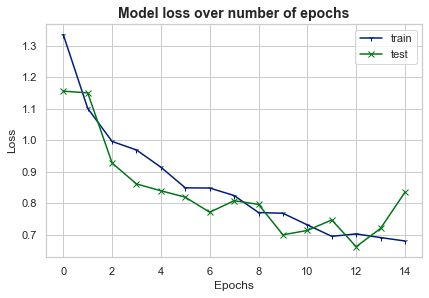

In [14]:
plt.plot(History.history['loss'], marker = "1")
plt.plot(History.history['val_loss'], marker = "x")
plt.title('Model loss over number of epochs', fontweight='bold', fontsize=14.0)
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()


### Accuracy of model
#### In this graph it shows the test accuracy is more tha training accuracy which shows that it is model is working perfectly fine for unseen images.

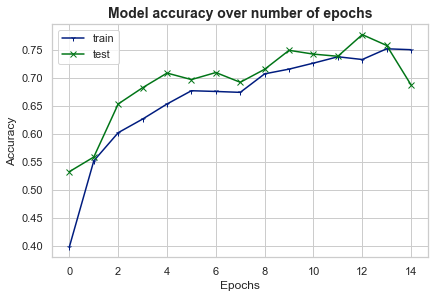

In [15]:
plt.plot(History.history['accuracy'], marker = "1")
plt.plot(History.history['val_accuracy'], marker = "x")
plt.title('Model accuracy over number of epochs', fontweight='bold', fontsize=14.0)
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

### Saving model for future transfer learning process.(This model will be saved at your disk where this project file will be saved)

In [13]:
#Saving and loading model
# serialize weights to HDF5
model.save("model.h5")
print("Saved model to disk")

Saved model to disk


#### Here we are predicting the test data by using the trained model.Confusion matrix is plotted actual value vs predicted values. Moreover, to know which flower is correctly predicted and which is not we are plotting confusion matrix which is very important part to understand. So here we cn see that 161 daisy, 177 sunflower, 158 tulip, 149 dandelion, and 148 rose are correctly predicted out of 1035 testing data. With "np.argmax" we are defining the index of an array that results in largest value of predicted probablities. The predicted probablities are ordered in such a way that value 0 belongs to first class, 1 belongs to second class and so on. 

[2 1 1 ... 1 2 0]


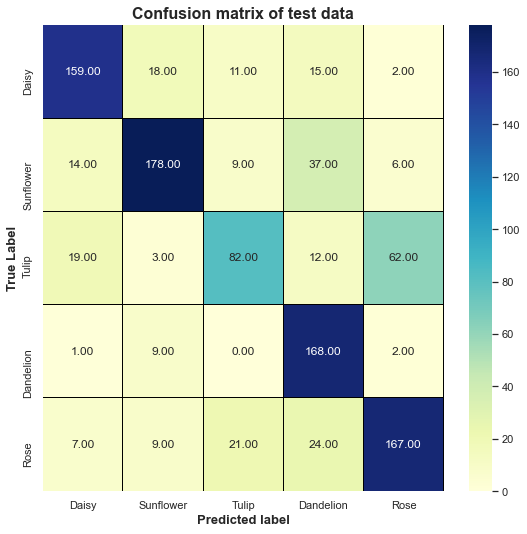

In [17]:
# getting predictions on val set.
from sklearn.metrics import confusion_matrix
label=['Daisy','Sunflower','Tulip','Dandelion', 'Rose']
pred=model.predict(x_test)
pred_digits=np.argmax(pred,axis=1)
Y_true = np.argmax(y_test,axis = 1)
confusion_mtx = confusion_matrix(Y_true,pred_digits)
f,ax = plt.subplots(figsize = (8,8))
sns.heatmap(confusion_mtx,annot=True,linewidths = 0.01,cmap="YlGnBu",
            linecolor = "black",fmt = ".2f",ax=ax, xticklabels=label,yticklabels=label
            )
plt.xlabel("Predicted label",fontweight='bold', fontsize=13.0)
plt.ylabel("True Label",fontweight='bold', fontsize=13.0)
plt.title("Confusion matrix of test data",fontweight='bold', fontsize=16.0)
plt.show()

#### Making indexes for properly and misclassified images.

In [19]:
# now storing some properly as well as misclassified indexes'.
i=0
prop_class=[]
mis_class=[]

for i in range(len(y_test)):
    if(np.argmax(y_test[i])==pred_digits[i]):
        prop_class.append(i)
    if(len(prop_class)==8):
        break

i=0
for i in range(len(y_test)):
    if(not np.argmax(y_test[i])==pred_digits[i]):
        mis_class.append(i)
    if(len(mis_class)==8):
        break

#### In above implementation of model we saw that flatten layer converts the input image to vector so to again convert vector data to images we have to use inverse Laplace transform to visulaize data in form of images. So here we have implemented Inverse Laplace Transform on predicted data.

Text(0.5, 0.98, 'Correctly Classified Images')

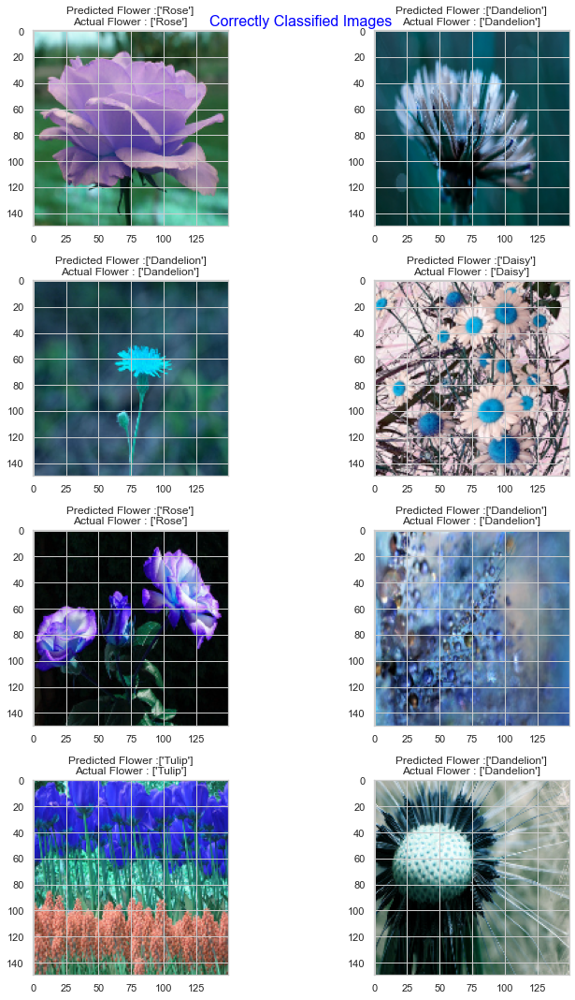

In [20]:
count=0
fig,ax=plt.subplots(4,2)
fig.set_size_inches(15,15)
for i in range (4):
    for j in range (2):
        ax[i,j].imshow(x_test[prop_class[count]])
        ax[i,j].set_title("Predicted Flower :"+str(le.inverse_transform([pred_digits[prop_class[count]]]))+"\n"+"Actual Flower : "+str(le.inverse_transform([np.argmax(y_test[prop_class[count]])]))) 
        plt.tight_layout()
        count+=1
fig.suptitle('Correctly Classified Images', color='blue', fontsize=16)

#### The reason to get misclassified images are that sometimes because of angle  of image model may misinterpret the images for instance, it mainly misinterpret the images between tulip and rose as they almost look like same when we see them at particular angle, same goes for dandelion and daisy. Moreover, we might can overcome from this error by training more dataset and increasing the epochs but as it also takes more memory consumption so we stick with 15 epochs which also gave us better accuracy.

Text(0.5, 0.98, 'Incorrectly Classified Images')

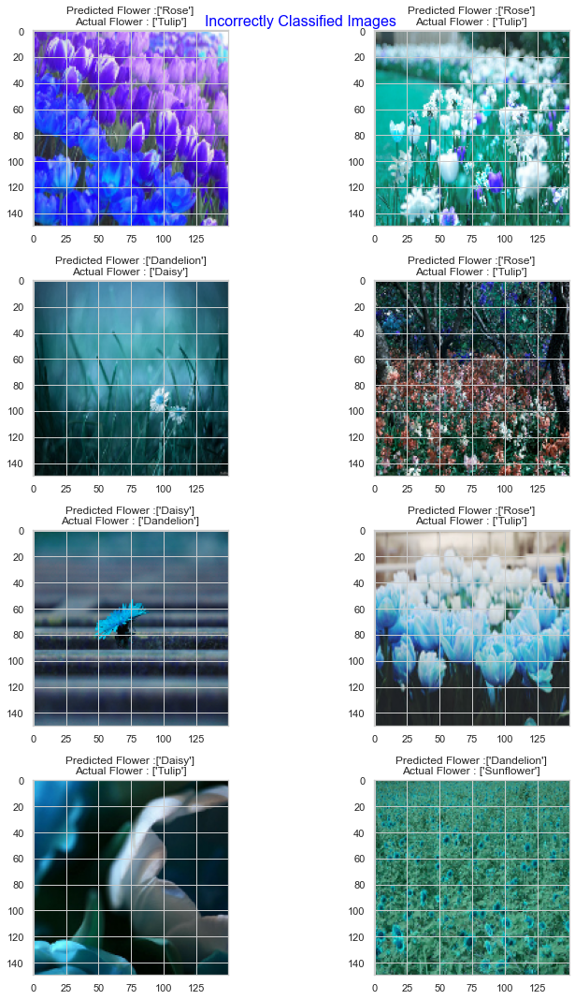

In [21]:
#Misclassified images

count=0
fig,ax=plt.subplots(4,2)
fig.set_size_inches(15,15)
for i in range (4):
    for j in range (2):
        ax[i,j].imshow(x_test[mis_class[count]])
        ax[i,j].set_title("Predicted Flower :"+str(le.inverse_transform([pred_digits[mis_class[count]]]))+"\n"+"Actual Flower : "+str(le.inverse_transform([np.argmax(y_test[mis_class[count]])]))) 
        plt.tight_layout()
        count+=1
fig.suptitle('Incorrectly Classified Images', color='blue', fontsize=16)

# Transfer Learning S-CNN MODEL FOR FASHION DATASET

### Loading and labeling dataset.

In [43]:
#--------------------------- Fashion --------------------------------
# Directory
X=[]
Y=[]
img_size=150
Fashion_ho_DIR= path_fashion + 'hoodies'
Fashion_hofemale_DIR= path_fashion + 'hoodies-female'
Fashion_long_DIR= path_fashion + 'longsleeve'
Fashion_shirt_DIR=path_fashion + 'shirt'
Fashion_sweatshirt_DIR= path_fashion + 'sweatshirt'
Dir = path_fashion

In [44]:
# Label function to label the fashion
def assign_label(Image,fashion_type):
    return fashion_type

#train data split
def make_train_data(fashion_type,Dir):
    for Image in tqdm(os.listdir(Dir)): #progress bar for better view
        label=assign_label(Image,fashion_type)
        path_fashion = os.path.join(Dir,Image)
        Image = cv2.imread(path_fashion,cv2.IMREAD_COLOR)
        Image = cv2.resize(Image, (img_size,img_size))
        #img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        
        X.append(np.array(Image))
        Y.append(str(label))

make_train_data('hoodies',Fashion_ho_DIR)
print('hoodies: ',len(X))

make_train_data('hoodies-female',Fashion_hofemale_DIR)
print('hoodies-female: ',len(X))

make_train_data('longsleeve',Fashion_long_DIR)
print('longsleeve: ',len(X))

make_train_data('shirt',Fashion_shirt_DIR)
print('shirt: ',len(X))

make_train_data('sweatshirt',Fashion_sweatshirt_DIR)
print('sweatshirt: ',len(X))


100%|██████████| 510/510 [00:31<00:00, 16.18it/s]sweatshirt:  4854



#### Here we repeating the same steps that we did earlier such as categorizing data and splitting training and testing data.

(((3640, 150, 150, 3), (1214, 150, 150, 3)), ((3640, 5), (1214, 5)))

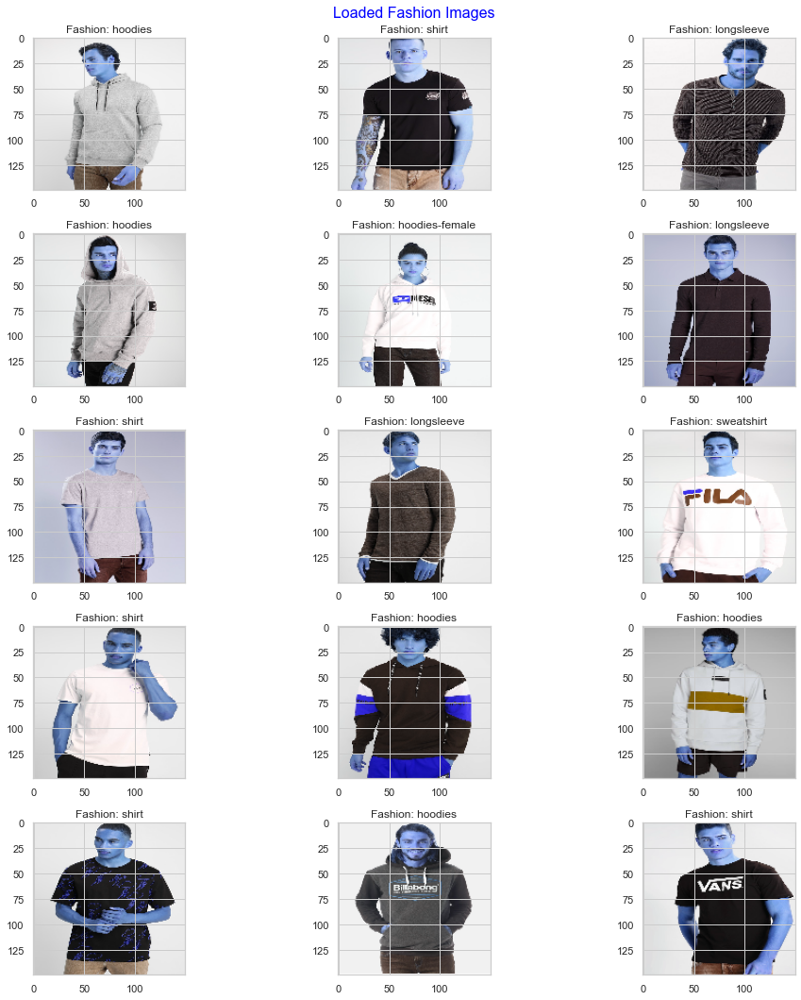

In [24]:
#Visualize Images
import random as rn
fig,ax=plt.subplots(5,3)
fig.set_size_inches(15,15)
for i in range(5):
    for j in range (3):
        l=rn.randint(0,len(Y))
        ax[i,j].imshow(X[l])
        ax[i,j].set_title('Fashion: '+Y[l])
fig.suptitle('Loaded Fashion Images', color='Blue', fontsize=16)           
plt.tight_layout()

from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
le=LabelEncoder()
p=le.fit_transform(Y)
p=to_categorical(p,5)
X=np.array(X)
X=X/255

from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(X,p,test_size=0.25,random_state=42)
# shape of the training and test set
(xtrain.shape, xtest.shape), (ytrain.shape, ytest.shape)

#### Loading the model which we have saved earlier for transfer learning. So here comes the part where we implement transfer learning method in which the pretrained model is used for second task of data. As we know that there are many pretrained models are available for better use but here we made our own custom model and used as a pretrained model which gave us a lot of knowledge for transfer learning.

In [25]:
#loading model
from keras.models import load_model
model_try = load_model('model.h5')

### Training the fashion dataset by using our custom pretrained model.

In [33]:
History_fashion = model_try.fit(data_generator.flow(xtrain,ytrain, batch_size=batch_size),
                              epochs = epochs, validation_data = (xtest,ytest),
                              verbose = 1, steps_per_epoch=xtrain.shape[0] // batch_size,callbacks=[red_lr])

Epoch 1/15
227/227 [==============================] - 109s 478ms/step - loss: 1.1052 - accuracy: 0.5875 - val_loss: 0.9005 - val_accuracy: 0.6870
Epoch 2/15
227/227 [==============================] - 102s 451ms/step - loss: 0.9915 - accuracy: 0.6305 - val_loss: 0.7885 - val_accuracy: 0.7100
Epoch 3/15
227/227 [==============================] - 103s 454ms/step - loss: 0.9147 - accuracy: 0.6667 - val_loss: 0.7667 - val_accuracy: 0.7100
Epoch 4/15
227/227 [==============================] - 102s 450ms/step - loss: 0.8732 - accuracy: 0.6805 - val_loss: 0.7746 - val_accuracy: 0.7076
Epoch 5/15
227/227 [==============================] - ETA: 0s - loss: 0.8332 - accuracy: 0.6948
Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
227/227 [==============================] - 103s 452ms/step - loss: 0.8332 - accuracy: 0.6948 - val_loss: 0.7971 - val_accuracy: 0.6837
Epoch 6/15
227/227 [==============================] - 103s 453ms/step - loss: 0.8079 - accuracy: 0.7058 -

#### Now predicting the testing data of fashion dataset based on training dataset. Moreover, the confusion matrix describes that 470 hoodies, 73 Hoodies of female, 126 longsleeve, 238 shirt and 42 sweatshirt are perfectly predicted images out of 1214 test images. 

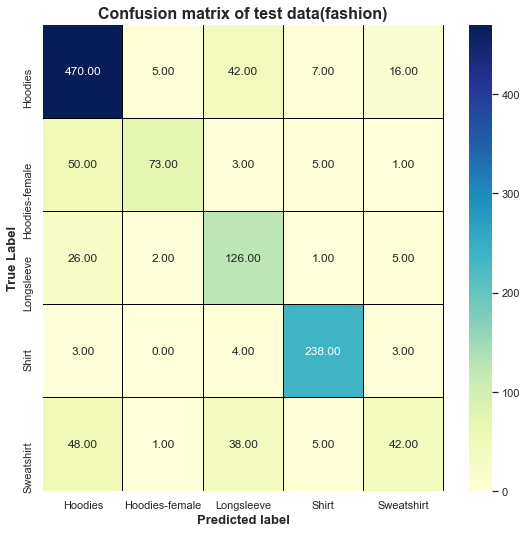

In [38]:
# getting predictions on val set.
pred1=model_try.predict(xtest)
pred_digits1=np.argmax(pred1,axis=1)
from sklearn.metrics import confusion_matrix
label=['Hoodies','Hoodies-female','Longsleeve','Shirt', 'Sweatshirt']
Y_true1 = np.argmax(ytest,axis = 1)
confusion_mtx1 = confusion_matrix(Y_true1,pred_digits1)
f,ax = plt.subplots(figsize = (8,8))
sns.heatmap(confusion_mtx1,annot=True,linewidths = 0.01,cmap="YlGnBu",
            linecolor = "black",fmt = ".2f",ax=ax, xticklabels=label,yticklabels=label
            )
plt.xlabel("Predicted label",fontweight='bold', fontsize=13.0)
plt.ylabel("True Label",fontweight='bold', fontsize=13.0)
plt.title("Confusion matrix of test data(fashion)",fontweight='bold', fontsize=16.0)
plt.show()

In [35]:
# now storing some properly as well as misclassified indexes'.
i=0
prop_class1=[]
mis_class1=[]

for i in range(len(ytest)):
    if(np.argmax(ytest[i])==pred_digits1[i]):
        prop_class1.append(i)
    if(len(prop_class1)==8):
        break

i=0
for i in range(len(ytest)):
    if(not np.argmax(ytest[i])==pred_digits1[i]):
        mis_class1.append(i)
    if(len(mis_class1)==8):
        break

#### As we explianed above to visualize the images or to get the data in image form we have to do inverse laplace transform which again we are performing over here on test data of fashion. Below is the correctly classified imags of fashion.

Text(0.5, 0.98, 'Correctly Classified Images')

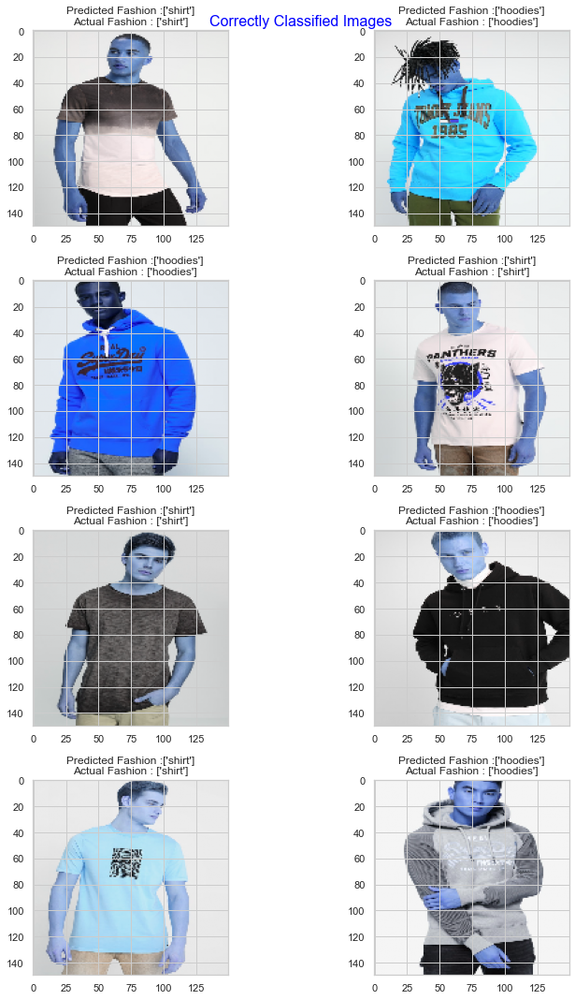

In [36]:
count=0
fig,ax=plt.subplots(4,2)
fig.set_size_inches(15,15)
for i in range (4):
    for j in range (2):
        ax[i,j].imshow(xtest[prop_class1[count]])
        ax[i,j].set_title("Predicted Fashion :"+str(le.inverse_transform([pred_digits1[prop_class1[count]]]))+"\n"+"Actual Fashion : "+str(le.inverse_transform([np.argmax(ytest[prop_class1[count]])]))) 
        plt.tight_layout()
        count+=1
fig.suptitle('Correctly Classified Images', color='blue', fontsize=16)

Text(0.5, 0.98, 'Incorrectly Classified Images')

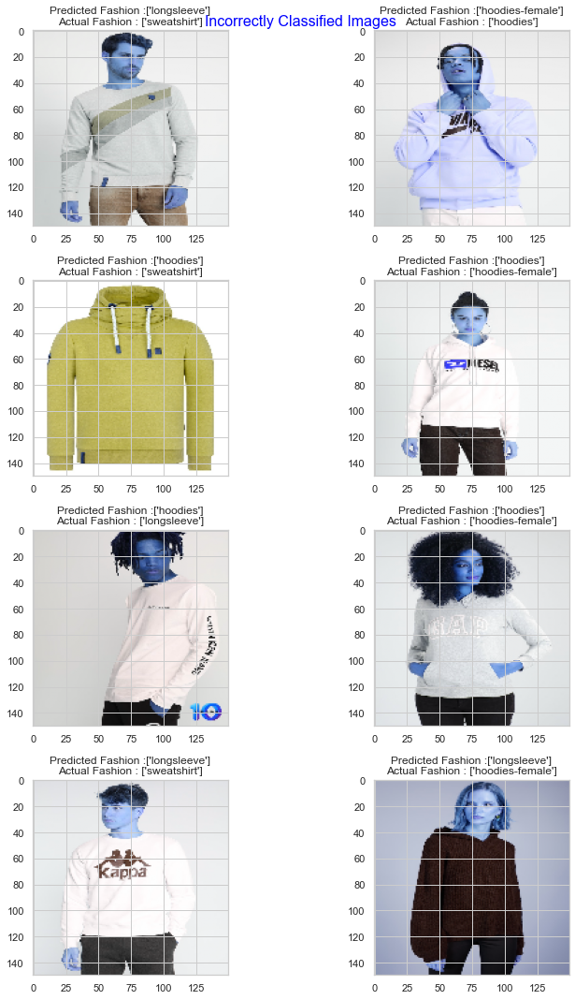

In [37]:
#Misclassified images
count=0
fig,ax=plt.subplots(4,2)
fig.set_size_inches(15,15)
for i in range (4):
    for j in range (2):
        ax[i,j].imshow(xtest[mis_class1[count]])
        ax[i,j].set_title("Predicted Fashion :"+str(le.inverse_transform([pred_digits1[mis_class1[count]]]))+"\n"+"Actual Fashion : "+str(le.inverse_transform([np.argmax(ytest[mis_class1[count]])]))) 
        plt.tight_layout()
        count+=1
fig.suptitle('Incorrectly Classified Images', color='blue', fontsize=16)

# IMPLEMENTING VGG AND INCEPTION MODEL ON FLOWERS DATASET

#### Making directories to visualize the general flower dataset and to check that data has been loaded properly or not.

In [18]:
# Making training and validation of dataset
train_dir = os.path.join(DIR, 'train')
validation_dir = os.path.join(DIR, 'validation')

# Directory with our training cat pictures
train_daisy_dir = os.path.join(train_dir, 'daisy')

# Directory with our training dog pictures
train_sunflower_dir = os.path.join(train_dir, 'sunflower')

# Directory with our training dog pictures
train_tulip_dir = os.path.join(train_dir, 'tulip')

# Directory with our validation cat pictures
validation_daisy_dir = os.path.join(validation_dir, 'daisy')

# Directory with our validation dog pictures
validation_sunflower_dir = os.path.join(validation_dir, 'sunflower')

# Directory with our validation dog pictures
validation_tulip_dir = os.path.join(validation_dir, 'tulip')

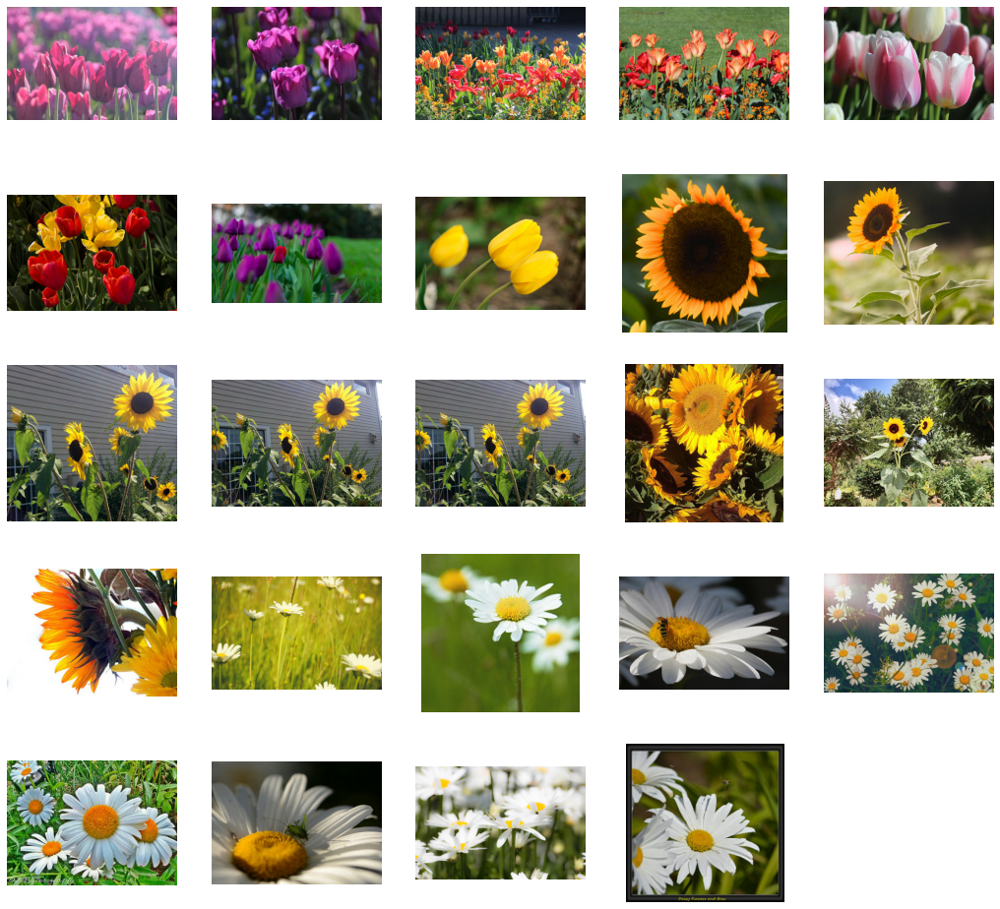

In [19]:
# Visualizing Images to make sure that Images have been loaded and working properly.
import matplotlib.image as mpimg
nrows = 4
ncols = 4

fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)
pic_index = 100
train_daisy_fnames = os.listdir( FLOWER_DAISY_DIR )
train_sunflower_fnames = os.listdir( FLOWER_SUNFLOWER_DIR )
train_tulip_fnames = os.listdir( FLOWER_TULIP_DIR )


next_daisy_pix = [os.path.join(FLOWER_DAISY_DIR, fname) 
                for fname in train_daisy_fnames[ pic_index-8:pic_index] 
               ]

next_sunflower_pix = [os.path.join(FLOWER_SUNFLOWER_DIR, fname) 
                for fname in train_sunflower_fnames[ pic_index-8:pic_index]
               ]

next_tulip_pix = [os.path.join(FLOWER_TULIP_DIR, fname) 
                for fname in train_tulip_fnames[ pic_index-8:pic_index]
               ]
for i, img_path in enumerate(next_tulip_pix+next_sunflower_pix+next_daisy_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(5, 5, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

#### Again here we are using data generator for both train and test data. We are using 2917 images for training data and 1246 for testing data.

In [20]:
data_generator1 = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=True,  # randomly flip images
        vertical_flip=False,
        validation_split=0.3)  # Validation split images
img_width, img_height = 150, 150
train_gen = data_generator1.flow_from_directory(
        DIR, 
        target_size=(img_height, img_width), 
        batch_size=batch_size, 
        class_mode="categorical", 
        subset="training")
valid_gen = data_generator1.flow_from_directory(
        DIR, 
        target_size=(img_height, img_width), 
        batch_size=batch_size, 
        class_mode="categorical", 
        subset="validation")

Found 2917 images belonging to 6 classes.
Found 1246 images belonging to 6 classes.


### Implementation of VGG and Inception model and just for the overview of pretrained model summary we have printed inception model summary.

In [21]:
from tensorflow.keras.applications.vgg16 import VGG16

#Shape of our images
#VCG Model 
base_model1 = VGG16(input_shape = (150, 150, 3), 
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

#Inception model
from tensorflow.keras.applications.inception_v3 import InceptionV3
base_model = InceptionV3(input_shape = (150, 150, 3), include_top = False, weights = 'imagenet')
base_model.summary()


[0]              
__________________________________________________________________________________________________
conv2d_73 (Conv2D)              (None, 7, 7, 192)    147456      average_pooling2d_6[0][0]        
__________________________________________________________________________________________________
batch_normalization_60 (BatchNo (None, 7, 7, 192)    576         conv2d_64[0][0]                  
__________________________________________________________________________________________________
batch_normalization_63 (BatchNo (None, 7, 7, 192)    576         conv2d_67[0][0]                  
__________________________________________________________________________________________________
batch_normalization_68 (BatchNo (None, 7, 7, 192)    576         conv2d_72[0][0]                  
__________________________________________________________________________________________________
batch_normalization_69 (BatchNo (None, 7, 7, 192)    576         conv2d_73[0][0]           

#### After loading and defining both models we have to add flatten and dense layer to remove unwanted noise and range the pixels value between 0 to 1. Moreover, here we have used optimizer as an RMSprop as an optimizer as it gradient based optimization technique which is used in neural networks for training data. Gradient have tendency to vanish as data propogates to through the function. RMSprop deals with the issues which uses moving average of squared gradients to normalize the gradients. In simple way, RMSprop uses an adaptive learning rate instead of using steady or hyperparameter which means the learning rate changes over time.

In [22]:
from tensorflow.keras import layers
# Flatten the output layer to 1 dimension
x = layers.Flatten()(base_model1.output)
y= layers.Flatten()(base_model.output)
# Add a fully connected layer with 512 hidden units and ReLU activation
x = layers.Dense(512, activation='relu')(x)
y= layers.Dense(512, activation='relu')(y)
# Add a dropout rate of 0.5
x = layers.Dropout(0.5)(x)
y = layers.Dropout(0.5)(y)

# Add a final sigmoid layer for classification
x = layers.Dense(1, activation='sigmoid')(x)
y = layers.Dense(1, activation='sigmoid')(y)

model_1 = tf.keras.models.Model(base_model1.input, x)
model_2 = tf.keras.models.Model(base_model.input, y)

model_1.compile(optimizer = tf.keras.optimizers.RMSprop(lr=0.0001), loss = 'binary_crossentropy',metrics = ['acc'])
model_2.compile(optimizer = tf.keras.optimizers.RMSprop(lr=0.0001), loss = 'binary_crossentropy',metrics = ['acc'])


#### Implementation of VGG model on training data with 5 epochs.(Note: In both pretrained model we have kept epochs 5 because accuracy remains steady and also it takes lots of time to run one epoch because of plethora of cnn layers in both models)

In [23]:
#training VCG model and generating accuaracy and loss of models.
vgghist = model_1.fit(train_gen, validation_data = valid_gen, steps_per_epoch = 100, epochs = 5)

Epoch 1/5
100/100 [==============================] - 686s 7s/step - loss: 0.5974 - acc: 0.8124 - val_loss: 0.4520 - val_acc: 0.8333
Epoch 2/5
100/100 [==============================] - 653s 7s/step - loss: 0.4586 - acc: 0.8333 - val_loss: 0.4610 - val_acc: 0.8333
Epoch 3/5
100/100 [==============================] - 574s 6s/step - loss: 0.4551 - acc: 0.8333 - val_loss: 0.4507 - val_acc: 0.8333
Epoch 4/5
100/100 [==============================] - 664s 7s/step - loss: 0.4536 - acc: 0.8333 - val_loss: 0.4507 - val_acc: 0.8333
Epoch 5/5
100/100 [==============================] - 673s 7s/step - loss: 0.4524 - acc: 0.8333 - val_loss: 0.4526 - val_acc: 0.8333


#### Implementation of Inception model on training data with 5 epochs.

In [47]:
#training Inception model and generating accuaracy and loss of models.
inc_history = model_2.fit(train_gen, validation_data = valid_gen, steps_per_epoch = 100, epochs = 5)

Epoch 1/5
100/100 [==============================] - 270s 3s/step - loss: 0.5248 - acc: 0.8242 - val_loss: 0.4741 - val_acc: 0.8333
Epoch 2/5
100/100 [==============================] - 272s 3s/step - loss: 0.4616 - acc: 0.8333 - val_loss: 0.4593 - val_acc: 0.8333
Epoch 3/5
100/100 [==============================] - 276s 3s/step - loss: 0.4584 - acc: 0.8333 - val_loss: 0.4561 - val_acc: 0.8333
Epoch 4/5
100/100 [==============================] - 273s 3s/step - loss: 0.4568 - acc: 0.8333 - val_loss: 0.4581 - val_acc: 0.8333
Epoch 5/5
100/100 [==============================] - 275s 3s/step - loss: 0.4563 - acc: 0.8333 - val_loss: 0.4651 - val_acc: 0.8333


### Visualizing both VGG and Inception model loss.

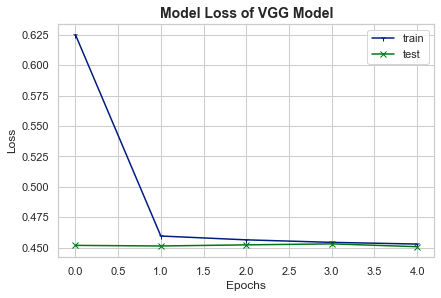

In [64]:
plt.plot(vgghist.history['loss'], marker = "1")
plt.plot(vgghist.history['val_loss'],marker = "x")
plt.title('Model Loss of VGG Model', fontweight='bold', fontsize=14.0)
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

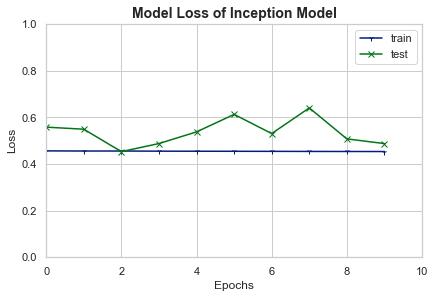

In [71]:
plt.plot(inc_history.history['loss'],marker = "1" )
plt.plot(inc_history.history['val_loss'], marker = "x")
plt.title('Model Loss of Inception Model', fontweight='bold', fontsize=14.0)
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.ylim(0,1)
plt.xlim(0,10)
plt.legend(['train', 'test'])
plt.show()


#### In both above figure we can see that training loss is decreasing as model learns more and more from training data. Moreover, there is also generalization gap between both training and testing data which proves model as good fit for dataset.

### Visualizing accuracy of VGG and Incepiton model.

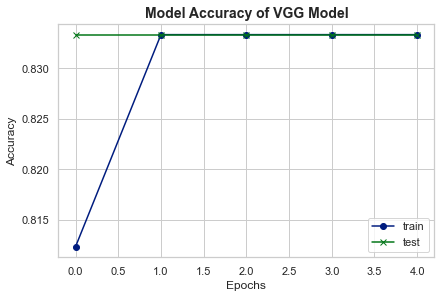

In [24]:
plt.plot(vgghist.history['acc'], marker = "o")
plt.plot(vgghist.history['val_acc'], marker = "x")
plt.title('Model Accuracy of VGG Model', fontweight='bold', fontsize=14.0)
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

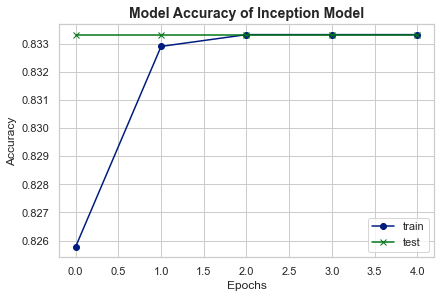

In [67]:
plt.plot(inc_history.history['acc'], marker = "o")
plt.plot(inc_history.history['val_acc'], marker = "x")
plt.title('Model Accuracy of Inception Model', fontweight='bold', fontsize=14.0)
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

#### From both above figure of accuracy we can conclude that training accuracy is increasing from 0.82 to 0.83 which does not show any major difference but still this models are high trained so accuracy remains steady at 0.83 as it has reached at its maximum training and loss point.Furthermore, it proves to be a good fit for flowers dataset.

# --------------------------------END OF CODE----------------------------